In [1]:
import pandas as pd
import geopandas as geopd
import numpy as np
import csv

import os

import datetime

from matplotlib.ticker import FuncFormatter
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"]  = 300
plt.rcParams.update({'font.size': 18})
plt.style.use('dark_background')

In [2]:
def read_daily_timeseries_csv(path, time_column='date'):
    """Convenience function for reading a daily timeseries from csv, and setting index as datetimeindex
    """
    df = pd.read_csv(path)
    df[time_column] = pd.to_datetime(df[time_column]) 
    df = df.set_index(time_column)
    return df
@FuncFormatter
def date_formatter(x, pos):
    time = pd.to_datetime(data_range[0]) + pd.Timedelta(days=x*4)
    #label = f"{time.year}-{time.month}"
    label = f"{time.year}"
    return label

def preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, src_path, data_range ):
    catchments = geopd.read_file(catchments_path, layer='attributes_v1')
    gauges = list(catchments['Paikka_Id'])

    natural_catchments = geopd.read_file(natural_gauges_path, layer='suitable_from_1995')
    natural_gauges = list(natural_catchments['Paikka_Id'])
    year_count = int(data_range[1])-int(data_range[0])
    """
    year_ticks = list(range(int(data_range[0]), int(data_range[1]) + 1, tick_freq))
    year_ticks = list(map(str, year_ticks))
    year_ticks = list(map(pd.to_datetime, year_ticks))
    
    ticks = []
    for tick in year_ticks:
        day_delta = pd.Timedelta(tick - year_ticks[0], unit='D').days
        sample_delta = np.ceil(day_delta / resampling_freq)
        ticks.append(sample_delta)
    
    labels = list(map(date_formatter, ticks))
    cm_conversion = 1/2.54  # centimeters in inches, for plt
    """
    # Selecting the right time and gauges
    mean_tmp = read_daily_timeseries_csv(mean_tmp_path)
    mean_tmp = mean_tmp.loc[data_range[0]:data_range[1], gauges]
    
    data = read_daily_timeseries_csv(src_path) 
    data = data.loc[data_range[0]:data_range[1], gauges]
    
    #day_count=len(data)
    
    # Sorting the columns based on the average temperature 
    sort_index = mean_tmp.mean().sort_values().index
    data = data[sort_index]

    region_codes = list(catchments.water_region_code.unique())
    region_codes.sort(reverse=True)
    final_sort = []
    for region_code in region_codes:
        region_catchments = catchments.loc[catchments.water_region_code == region_code]
        region_gauges = list(region_catchments.Paikka_Id)
        # Reordering regional order by temperature
        region_sort = [gauge for gauge in sort_index if gauge in region_gauges]
        final_sort.extend(region_sort)

    data=data[final_sort]
    # Resampling to four daily to get coarse enough results 
    dropped_data = data.dropna(axis=1, thresh=year_count*340)
    resampled_data = dropped_data.resample(str(resampling_freq) +'D').mean()
    resampled_data = resampled_data.transpose()
    
    natural_data = resampled_data.loc[resampled_data.index.isin(natural_gauges)]
    unnatural_data = resampled_data.loc[~resampled_data.index.isin(natural_gauges)]

    return resampled_data, natural_data, unnatural_data

In [3]:
# used for ensuring only the latest set of gauges is used
catchments_path = "/home/iielse/Documents/DIWA/data/CAMELS-FI catchments/CAMELS-FI_catchments.gpkg"
#catchments = geopd.read_file(catchments_path, layer='attributes_v1')
#gauges = list(catchments['Paikka_Id'])

natural_gauges_path = "/home/iielse/Documents/DIWA/data/SYKE/flow/measurement_locations.gpkg"
#natural_catchments = geopd.read_file(natural_gauges_path, layer='suitable_from_1995')
#natural_gauges = list(natural_catchments['Paikka_Id'])
# used for reoreding the columns
mean_tmp_path = '/media/iielse/T9/CAMELS-FI/data/timeseries_by_attribute/temperature_mean.csv'

src_root = '/media/iielse/T9/CAMELS-FI/data/timeseries_by_attribute/'

data_range = ("1990", "2020")
year_count = int(data_range[1])-int(data_range[0])
resampling_freq = 4

tick_freq = 5 # years
year_ticks = list(range(int(data_range[0]), int(data_range[1]) + 1, tick_freq))
year_ticks = list(map(str, year_ticks))
year_ticks = list(map(pd.to_datetime, year_ticks))

ticks = []
for tick in year_ticks:
    day_delta = pd.Timedelta(tick - year_ticks[0], unit='D').days
    sample_delta = np.ceil(day_delta / resampling_freq)
    ticks.append(sample_delta)

labels = list(map(date_formatter, ticks))

cm_conversion = 1/2.54  # centimeters in inches, for plt

'\n# Selecting the right time and gauges\nmean_tmp = read_daily_timeseries_csv(mean_tmp_path)\nmean_tmp = mean_tmp.loc[data_range[0]:data_range[1], gauges]\n\ndata = read_daily_timeseries_csv(src_path) \ndata = data.loc[data_range[0]:data_range[1], gauges]\n\nday_count=len(data)\n\n# Sorting the columns based on the average temperature \nsort_index = mean_tmp.mean().sort_values().index\ndata = data[sort_index]\n# Dividing the temperature sorted values into regions\n'

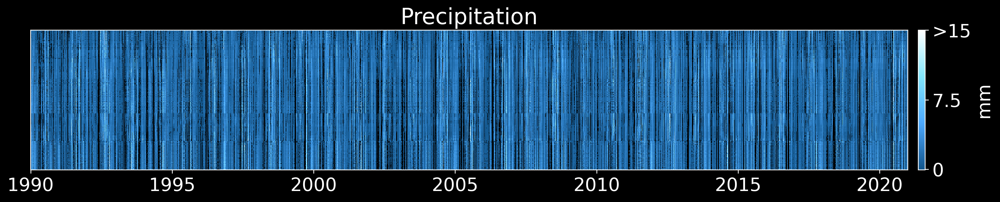

In [7]:
vmax=15
vmin=0
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'precipitation.csv'), data_range)
plt_data = resampled_data

plt_data = plt_data.where(cond=plt_data> 0.05, other=np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#4ca9ff', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Precipitation', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels([f'{vmin}', str(round((vmax-vmin)/2, 1)), f'>{vmax}'])
dst_path = 'weather/precipitation_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

In [8]:
plt_data.max().max()

35.275

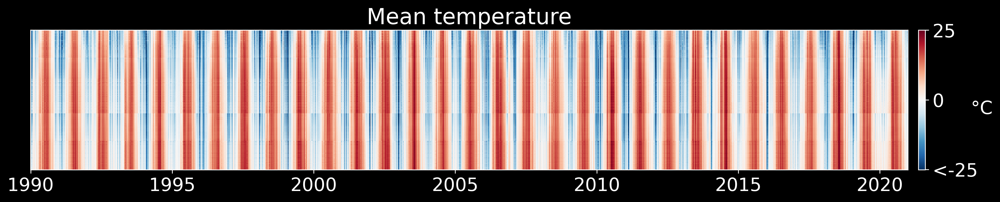

In [9]:
vmax=25
vmin=-25
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'temperature_mean.csv'), data_range)
plt_data = resampled_data
# dropping zero values to make it clearer if there is some snow or no snow
#plt_data = plt_data.replace(0, np.nan)
#cmap= LinearSegmentedColormap.from_list('DIWA_temp', ['#83e7fc', '#000000', '#ff0000'])
cmap='RdBu_r'
fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Mean temperature', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[vmin+0.05, 0, vmax])
cbar.ax.set_ylabel('°C', rotation=0)
cbar.set_ticklabels([f'<{vmin}', '0', f'{vmax}'])
dst_path = 'weather/mean_temperature_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

In [12]:


with open('colorbars/order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(resampled_data.index)

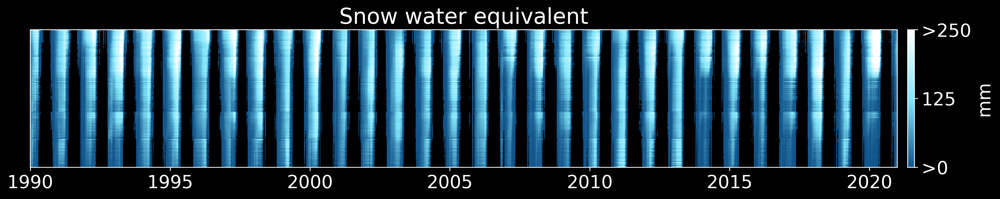

In [20]:
vmax=250
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'swe.csv'), data_range)
plt_data = resampled_data
# dropping zero values to make it clearer if there is some snow or no snow
plt_data = plt_data.replace(0, np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Snow water equivalent', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['>0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/swe_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

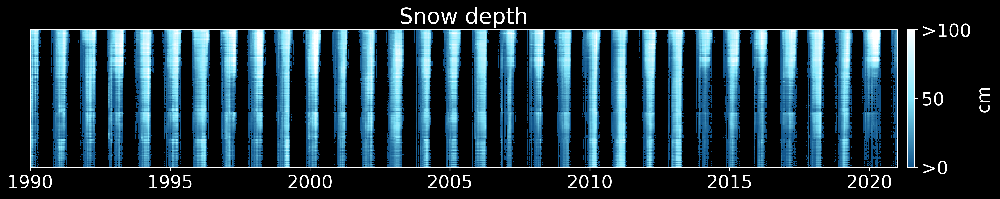

In [19]:
vmax=100
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'snow_depth.csv'), data_range)
plt_data = resampled_data
# dropping zero values to make it clearer if there is some snow or no snow
plt_data = plt_data.replace(0, np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Snow depth', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('cm', rotation=90)
cbar.set_ticklabels(['>0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/snow_depth_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

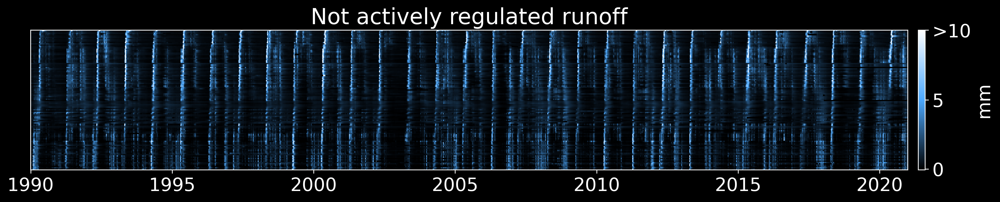

In [18]:
vmax=10
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'discharge_spec.csv'), data_range)
plt_data = natural_data

cmap= LinearSegmentedColormap.from_list('DIWA', ['#000000', '#4CA9FF', '#ffffff'])

fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title(f'Not actively regulated runoff', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/dis_spec_natural_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

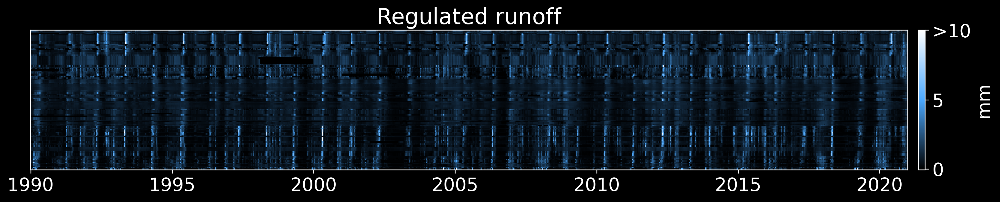

In [16]:
vmax=10
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'discharge_spec.csv'), data_range)
plt_data = unnatural_data

cmap= LinearSegmentedColormap.from_list('DIWA', ['#000000', '#4CA9FF', '#ffffff'])

fig, ax = plt.subplots(figsize=(37*cm_conversion, 6.5*cm_conversion))

imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')
ax.yaxis.set_visible(False)
result_ticks = ax.set_xticks(ticks, labels)

plt.title('Regulated runoff', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/dis_spec_unnatural_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

In [17]:
# Saving the order for regional colorbar
with open('colorbars/natural_order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(list(natural_data.index))

with open('colorbars/unnatural_order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(list(unnatural_data.index))



In [24]:
natural_data.index

Index(['1390', '1411', '1373', '1374', '1413', '1414', '1417', '1415', '1419',
       '1352_1358',
       ...
       '1090', '1123', '1097', '1116', '1110', '1089', '1117', '1122', '1098',
       '1120'],
      dtype='object', length=106)

# pet

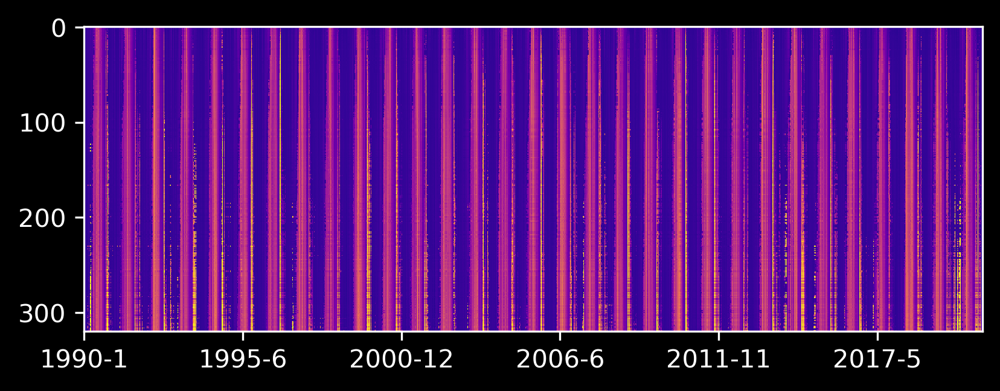

In [38]:
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='plasma', vmax=8, aspect=3, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

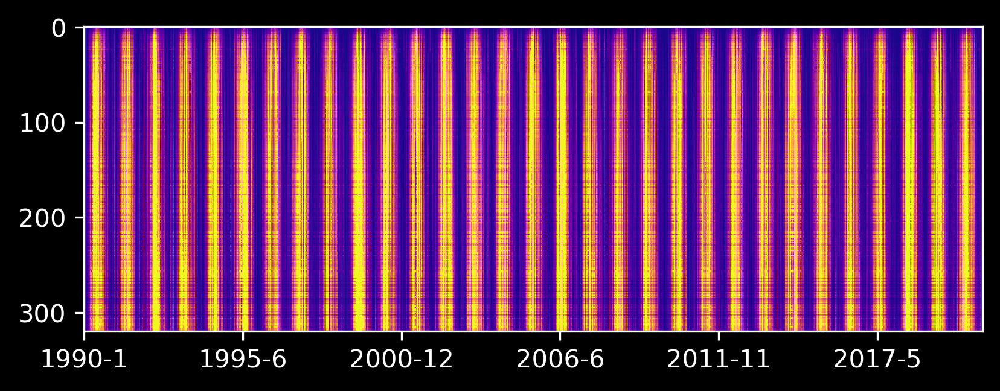

In [42]:
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='plasma', vmax=20, aspect=3, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

# Unnatural discharge

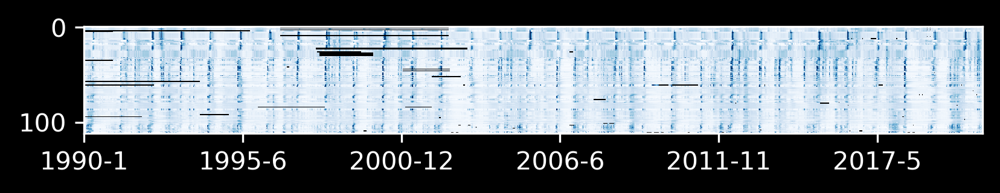

In [28]:
fig, ax = plt.subplots()
imax = ax.imshow(unnatural_data, cmap='Blues', vmax=5, aspect=3, interpolation='none')

ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

# Natural discharge

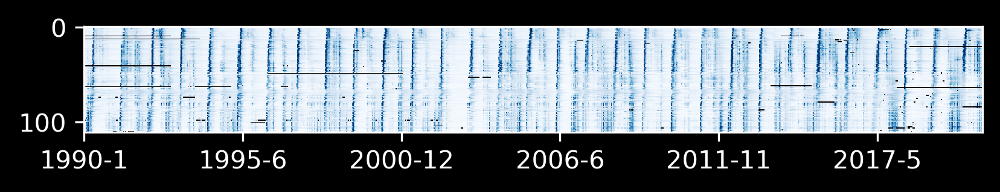

In [29]:


fig, ax = plt.subplots()
imax = ax.imshow(natural_data, cmap='Blues', vmax=5, aspect=3, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

# Precipitation

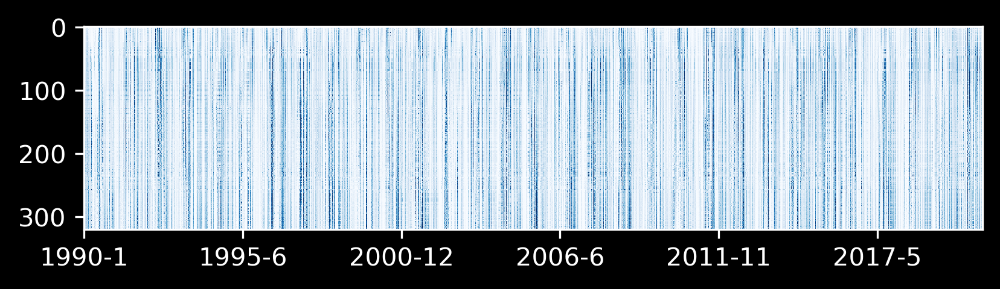

In [8]:
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='Blues',vmax=10, aspect=2, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

# Snow depth

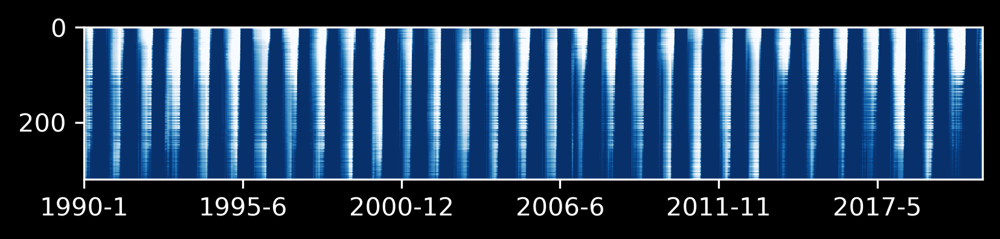

In [20]:
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='Blues_r',vmax=150, aspect=1.5, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

# Temperature

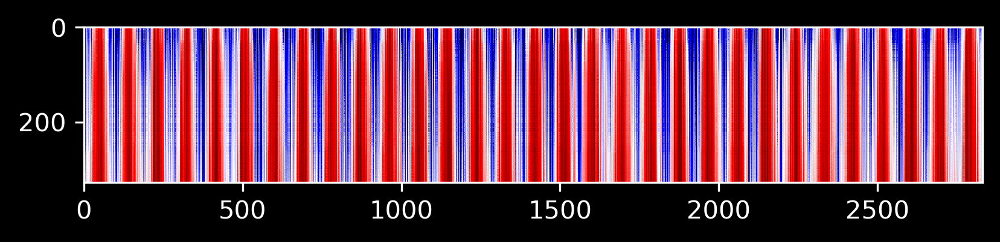

In [71]:
ax = plt.imshow(resampled_data, cmap='seismic', vmin=(-20, 20), aspect=1.5, interpolation='none')

In [19]:
tmp_series = mean_tmp.mean()
tmp_series.name = 'temperature_yearly_mean'
catchments = catchments.join(tmp_series, on='Paikka_Id')

In [26]:
data_series = data.mean() 
data_series.name = 'q_spec_mean'
catchments = catchments.join(data_series, on='Paikka_Id')

In [27]:
catchments.to_file(catchments_path, layer="attributes_v1", driver='GPKG')

In [13]:
mean_tmp.mean()

996     3.636006
1003    3.561353
1008    3.762704
1009    3.765522
1012    3.795293
          ...   
961     3.479546
964     4.085781
1369    1.069981
1366    1.248097
1357   -0.241138
Length: 320, dtype: float64

In [114]:
time = pd.to_datetime(data_range[0]) + timedelta(days=365)

In [20]:
catchments

,Paikka_Id,area,crop_perc_2000,grass_perc_2000,shrubs_perc_2000,dwood_perc_2000,ewood_perc_2000,urban_perc_2000,inwater_perc_2000,bares_perc_2000,...,peat_perc,soil_depth,slope,elev_min,elev_max,elev_range,nestedness,dam_count,geometry,temperature_yearly_mean
0,996,3.079473e+09,6.654220,0.091192,17.140426,3.592700,54.970782,2.726711,8.899365,0.172708,...,25.1479,10.9001,2.3149,107.508003,269.454987,161.946991,10.0,25.0,"MULTIPOLYGON (((381210 7007980, 381230 7007980...",3.636006
1,1003,2.158788e+09,5.897477,0.102858,15.528577,6.394733,49.800852,2.309118,17.425138,0.161258,...,21.6176,9.5547,1.8085,101.355003,239.233994,137.878998,13.0,11.0,"MULTIPOLYGON (((461570 7052380, 461590 7052380...",3.561353
2,1008,5.763810e+09,5.602596,0.095476,14.940969,6.364929,47.588412,2.931040,20.514123,0.190486,...,15.7472,9.8980,2.3433,94.766998,239.233994,144.466995,12.0,20.0,"MULTIPOLYGON (((461570 7052380, 461590 7052380...",3.762704
3,1009,5.966547e+09,5.718778,0.096047,15.010927,6.392424,47.726280,2.959742,20.181268,0.186063,...,15.5247,9.8728,2.3697,90.000000,239.233994,149.233994,11.0,21.0,"MULTIPOLYGON (((461570 7052380, 461590 7052380...",3.765522
4,1012,6.883996e+09,6.096145,0.111552,15.140834,6.393620,47.528304,3.083913,19.803403,0.180360,...,14.6877,9.8848,2.4046,86.246002,239.233994,152.987991,10.0,23.0,"MULTIPOLYGON (((459800 6911040, 459810 6911040...",3.795293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,961,2.072101e+09,3.144400,0.122794,15.951874,5.011132,49.352108,2.716558,21.532180,0.192469,...,11.3135,11.2434,3.4011,95.541000,295.407013,199.866013,1.0,11.0,"MULTIPOLYGON (((589840 7022170, 589850 7022170...",3.479546
316,964,4.485919e+08,2.416908,0.037743,13.189718,5.211241,53.593633,2.490319,21.615438,0.161477,...,10.5958,8.0723,3.4081,94.288002,210.623993,116.335991,1.0,1.0,"MULTIPOLYGON (((518500 6957260, 518520 6957260...",4.085781
317,1369,2.014959e+08,0.013861,0.053905,22.110785,1.200997,56.893487,0.334825,10.182136,0.153705,...,14.0708,10.9167,2.9365,145.302002,361.101013,215.799011,6.0,7.0,"MULTIPOLYGON (((494639.907 7381100.953, 494639...",1.069981
318,1366,3.985687e+08,1.513626,0.157221,24.879786,4.955514,50.029138,0.761176,7.553329,0.104555,...,17.4564,9.9107,2.3100,124.541000,362.648987,238.107986,6.0,2.0,"MULTIPOLYGON (((488929.91 7356730.68, 488929.9...",1.248097


In [9]:
mean_tmp.transpose()

date,1990-01-01,1990-01-02,1990-01-03,1990-01-04,1990-01-05,1990-01-06,1990-01-07,1990-01-08,1990-01-09,1990-01-10,...,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29,2020-12-30,2020-12-31
996,-4.0,-8.3,-18.0,-6.1,-3.3,-1.9,-2.0,-1.0,-4.1,-2.3,...,2.6,0.0,-0.4,-2.3,-6.2,-2.3,-2.1,-2.3,-1.6,0.3
1003,-3.8,-9.5,-18.3,-8.9,-4.8,-2.3,-1.9,-0.4,-4.9,-3.0,...,2.5,-0.2,-1.0,-2.7,-6.7,-3.4,-2.4,-2.0,-1.9,0.3
1008,-3.6,-9.4,-17.6,-8.6,-3.7,-1.9,-1.8,-0.5,-4.4,-3.2,...,2.7,-0.3,-0.7,-2.3,-6.1,-3.2,-2.3,-1.8,-1.3,0.3
1009,-3.6,-9.4,-17.7,-8.6,-3.6,-1.9,-1.8,-0.5,-4.4,-3.2,...,2.7,-0.3,-0.6,-2.2,-6.1,-3.2,-2.3,-1.8,-1.3,0.3
1012,-3.6,-9.3,-17.6,-8.5,-3.4,-1.9,-1.8,-0.5,-4.3,-3.1,...,2.7,-0.2,-0.6,-2.2,-6.0,-3.1,-2.2,-1.8,-1.2,0.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
961,-3.7,-10.3,-19.3,-11.2,-4.6,-3.0,-2.4,-0.5,-3.9,-4.9,...,2.2,-0.6,-1.2,-2.4,-6.1,-4.5,-2.6,-3.3,-1.8,-0.1
964,-3.4,-9.5,-16.1,-8.6,-2.7,-1.7,-1.6,-0.8,-3.5,-3.8,...,3.0,-0.4,-0.4,-1.7,-5.5,-3.4,-2.3,-1.4,-0.5,0.4
1369,-4.1,-13.9,-14.9,-11.2,-12.6,-10.4,-4.0,-5.4,-10.6,-13.6,...,1.0,0.3,-3.4,-10.0,-17.4,-13.4,-3.9,-4.0,-6.4,-3.0
1366,-4.3,-13.5,-15.0,-11.6,-11.8,-9.8,-3.6,-4.8,-10.6,-12.7,...,1.1,0.3,-3.4,-9.7,-16.5,-12.6,-3.7,-3.9,-6.3,-2.4


In [25]:
data.mean()

1390    1.280461
1411    1.035070
1373    1.060442
1374    1.027344
1413    1.121572
          ...   
3678    0.686948
1120    0.771862
1100    1.116067
3006    1.123886
3524    1.020044
Length: 320, dtype: float64